In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import seaborn as sns
import sklearn

В задаче необходимо узнать, одобрен ли кредит в банке человеку, зная определенную информацию о нем.
В данном датасете представлена информация о 24000 людей, пытающихся получить одобрение на кредит на основе следующих характеристик, например, сумма кредита, пол, образование клиента и другие.
Задача состоит в том, чтобы научиться на основе этих данных определять, одобрен ли кредит.

# Загружаем данные

In [7]:
url = "https://raw.githubusercontent.com/vaalexeeva/ML_Alekseeva_Valeriya_381803-1/main/credit.csv"
data_raw = pd.read_csv(url)
#data_raw = pd.read_csv('credit.csv')

Обратим внимание на размер таблицы. В ней содержится 24000 записей (строк) и 24 признака (столбцов).

In [35]:
data_raw.shape

(24000, 24)

In [41]:
data_raw

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
0,20000,2,2,1,24,2,2,-1,-1,-2,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,90000,2,2,2,34,0,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
2,50000,2,2,1,37,0,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
3,50000,1,2,1,57,-1,0,-1,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0
4,50000,1,1,2,37,0,0,0,0,0,...,19394.0,19619.0,20024.0,2500.0,1815.0,657.0,1000.0,1000.0,800.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23995,80000,1,2,2,34,2,2,2,2,2,...,77519.0,82607.0,81158.0,7000.0,3500.0,0.0,7000.0,0.0,4000.0,1
23996,150000,1,3,2,43,-1,-1,-1,-1,0,...,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0,0
23997,30000,1,2,2,37,4,3,2,-1,0,...,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0,1
23998,80000,1,3,1,41,1,-1,0,0,0,...,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0,1


Также увидим, какие значения принимают признаки.

In [43]:
for column in data_raw.columns :
    print(column, '          ', data_raw[column].unique())

LIMIT_BAL            [  20000   90000   50000  100000  140000  200000  260000  630000  250000
  320000  360000  180000  130000   70000  450000   60000  230000  500000
  160000  280000   10000  150000  380000  310000  400000   80000  300000
   30000  240000  470000  480000  350000  330000  110000  420000  210000
  170000  370000  270000  220000   40000  510000  120000  460000  440000
  340000  410000  490000  390000  580000  290000  190000  700000  670000
  680000  430000  550000  540000 1000000  600000  530000  710000  560000
  520000  750000  640000  610000  570000  590000  660000  620000  720000
  327680  740000  800000  760000  650000  780000  730000   16000]
SEX            [2 1]
EDUCATION            [2 1 3 5 4 6 0]
MARRIAGE            [1 2 3 0]
AGE            [24 34 37 57 23 28 35 51 41 29 49 39 26 40 27 30 47 33 32 54 58 25 31 22
 46 42 56 45 44 53 43 63 36 52 38 48 60 50 75 55 61 73 59 21 67 66 70 72
 64 65 71 62 68 69 79 74]
PAY_1            [ 2  0 -1 -2  1  3  4  8  7  5  6]
PA

# Боремся с выбросами

Построим диаграммы рассеивания для всех признаков, принимающих много различных значений.
Увидим, что значения часто сгруппированы, но имеются отдельные выбросы.

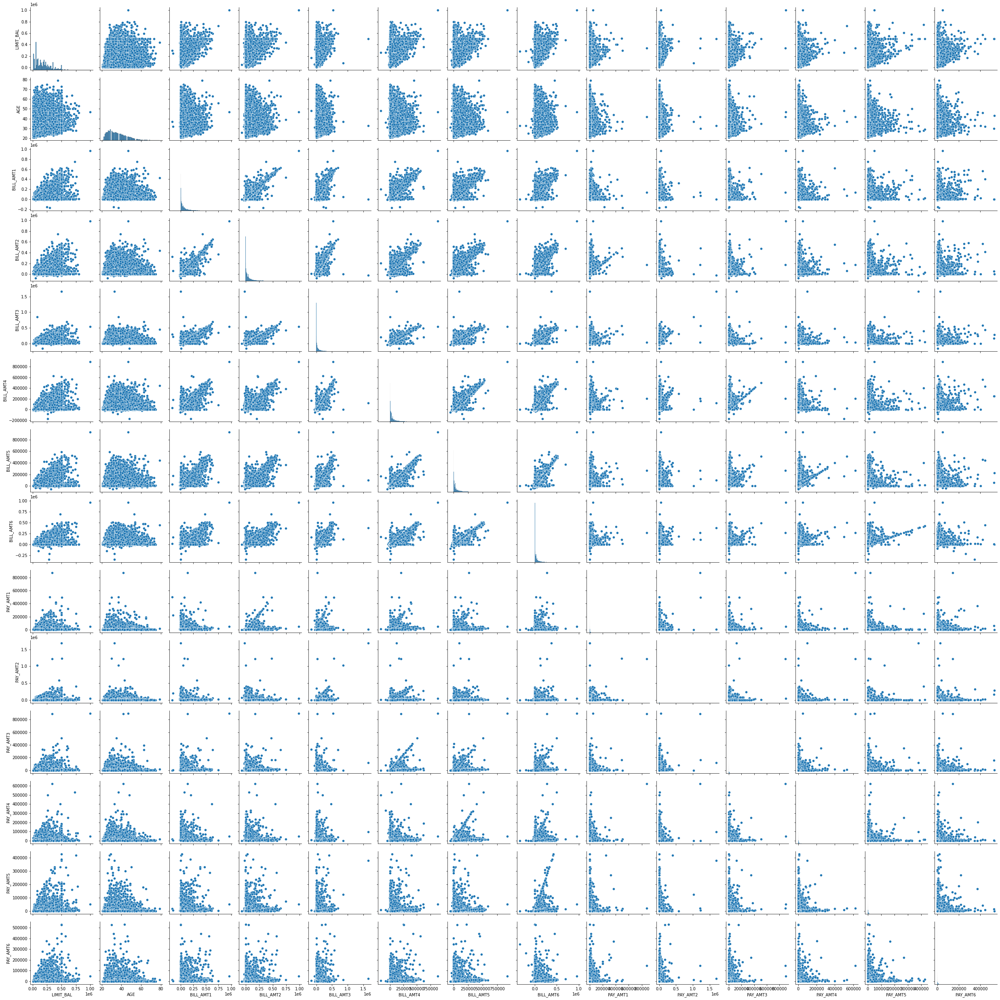

In [45]:
sns.pairplot(data_raw[['LIMIT_BAL', 'AGE'] + [f'BILL_AMT{i}' for i in range(1, 7)] + [f'PAY_AMT{i}' for i in range(1, 7)]])

Построим графики всех признаков. Отметим на графиках красной линией значение квантиля 0.995.
Видно, что 0.5% значений находятся выше этой прямой и выбиваются из общего набора.

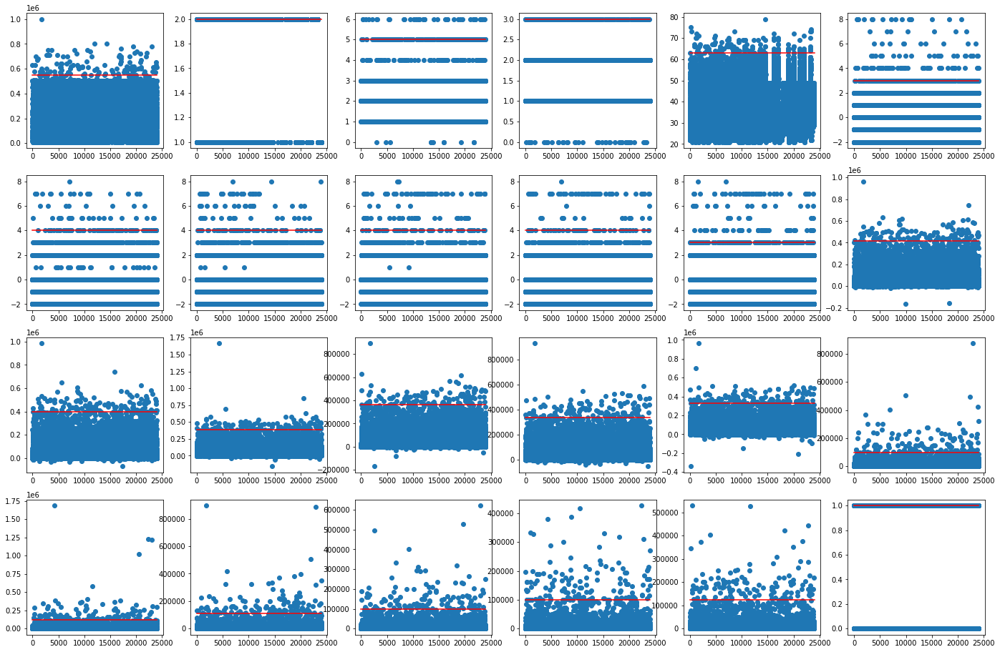

In [10]:
i = 1
plt.rcParams["figure.figsize"] = (24, 16)
for column in data_raw.columns :
  plt.subplot(4, 6, i)
  plt.scatter([i for i in range(len(data_raw[column]))], data_raw[column])
  for quantile in data_raw[column].quantile([.995]) :
    plt.plot([0, len(data_raw[column])], [quantile, quantile], 'r-')
  i += 1

Удалим все записи, в которых значения выходят за пределы квантилей 0.005 и 0.995.

In [11]:
rows_to_drop = data_raw[
    (data_raw['LIMIT_BAL'] < data_raw['LIMIT_BAL'].quantile(0.005)) | (data_raw['LIMIT_BAL'] > data_raw['LIMIT_BAL'].quantile(0.995)) |
    (data_raw['AGE'] < data_raw['AGE'].quantile(0.005)) | (data_raw['AGE'] > data_raw['AGE'].quantile(0.995)) |
    (data_raw['BILL_AMT1'] < data_raw['BILL_AMT1'].quantile(0.005)) | (data_raw['BILL_AMT1'] > data_raw['BILL_AMT1'].quantile(0.995)) |
    (data_raw['BILL_AMT2'] < data_raw['BILL_AMT2'].quantile(0.005)) | (data_raw['BILL_AMT2'] > data_raw['BILL_AMT2'].quantile(0.995)) |
    (data_raw['BILL_AMT3'] < data_raw['BILL_AMT3'].quantile(0.005)) | (data_raw['BILL_AMT3'] > data_raw['BILL_AMT3'].quantile(0.995)) |
    (data_raw['BILL_AMT4'] < data_raw['BILL_AMT4'].quantile(0.005)) | (data_raw['BILL_AMT4'] > data_raw['BILL_AMT4'].quantile(0.995)) |
    (data_raw['BILL_AMT5'] < data_raw['BILL_AMT5'].quantile(0.005)) | (data_raw['BILL_AMT5'] > data_raw['BILL_AMT5'].quantile(0.995)) |
    (data_raw['BILL_AMT6'] < data_raw['BILL_AMT6'].quantile(0.005)) | (data_raw['BILL_AMT6'] > data_raw['BILL_AMT6'].quantile(0.995)) |
    (data_raw['PAY_AMT1'] < data_raw['PAY_AMT1'].quantile(0.005)) | (data_raw['PAY_AMT1'] > data_raw['PAY_AMT1'].quantile(0.995)) |
    (data_raw['PAY_AMT2'] < data_raw['PAY_AMT2'].quantile(0.005)) | (data_raw['PAY_AMT2'] > data_raw['PAY_AMT2'].quantile(0.995)) |
    (data_raw['PAY_AMT3'] < data_raw['PAY_AMT3'].quantile(0.005)) | (data_raw['PAY_AMT3'] > data_raw['PAY_AMT3'].quantile(0.995)) |
    (data_raw['PAY_AMT4'] < data_raw['PAY_AMT4'].quantile(0.005)) | (data_raw['PAY_AMT4'] > data_raw['PAY_AMT4'].quantile(0.995)) |
    (data_raw['PAY_AMT5'] < data_raw['PAY_AMT5'].quantile(0.005)) | (data_raw['PAY_AMT5'] > data_raw['PAY_AMT5'].quantile(0.995)) |
    (data_raw['PAY_AMT6'] < data_raw['PAY_AMT6'].quantile(0.005)) | (data_raw['PAY_AMT6'] > data_raw['PAY_AMT6'].quantile(0.995))
]
#data = data_raw.drop(rows_to_drop)

In [12]:
rows_to_drop

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
10,630000,2,2,2,41,-1,0,-1,-1,-1,...,6500.0,6500.0,2870.0,1000.0,6500.0,6500.0,6500.0,2870.0,0.0,0
14,320000,1,1,1,49,0,0,0,-1,-1,...,70074.0,5856.0,195599.0,10358.0,10000.0,75940.0,20000.0,195599.0,50000.0,0
31,160000,1,1,2,30,-1,-1,-2,-2,-2,...,-923.0,-1488.0,-1884.0,131.0,396.0,396.0,565.0,792.0,0.0,0
35,360000,1,1,2,33,0,0,0,0,0,...,628699.0,195969.0,179224.0,10000.0,7000.0,6000.0,188840.0,28000.0,4000.0,0
47,400000,2,2,1,29,0,0,0,0,0,...,360199.0,356656.0,364089.0,17000.0,15029.0,30000.0,12000.0,12000.0,23000.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23940,60000,1,2,3,41,0,0,0,0,0,...,26940.0,9971.0,-11798.0,2200.0,2000.0,1200.0,0.0,0.0,28000.0,0
23962,500000,1,2,2,31,0,0,-1,0,0,...,278725.0,89161.0,87863.0,6025.0,294318.0,10254.0,7524.0,5009.0,2333.0,0
23968,610000,1,1,2,31,0,-1,2,-1,-1,...,347303.0,248893.0,269528.0,323014.0,1605.0,349395.0,250144.0,271099.0,220076.0,0
23977,190000,1,1,1,37,0,0,0,0,0,...,29223.0,19616.0,148482.0,2000.0,3869.0,25128.0,10115.0,148482.0,4800.0,0


In [13]:
data = data_raw.drop(rows_to_drop.index)

Снова построим графики всех признаков. Видно, что значения стали более сгруппированые, количество выбросов уменьшилось.

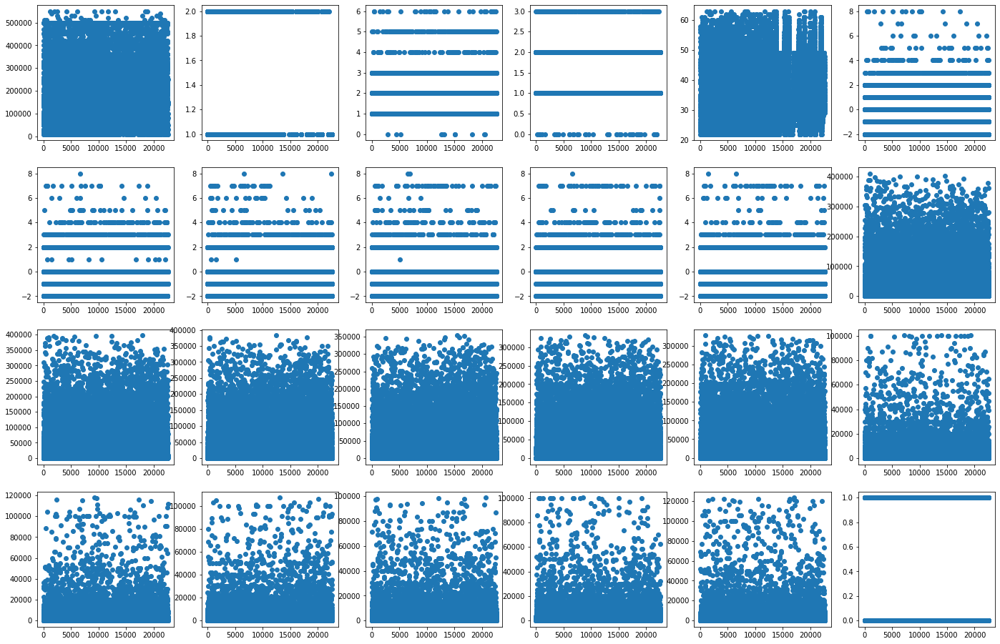

In [14]:
i = 1
plt.rcParams["figure.figsize"] = (24, 16)
for column in data.columns :
  plt.subplot(4, 6, i)
  plt.scatter([i for i in range(len(data[column]))], data[column])
  i += 1

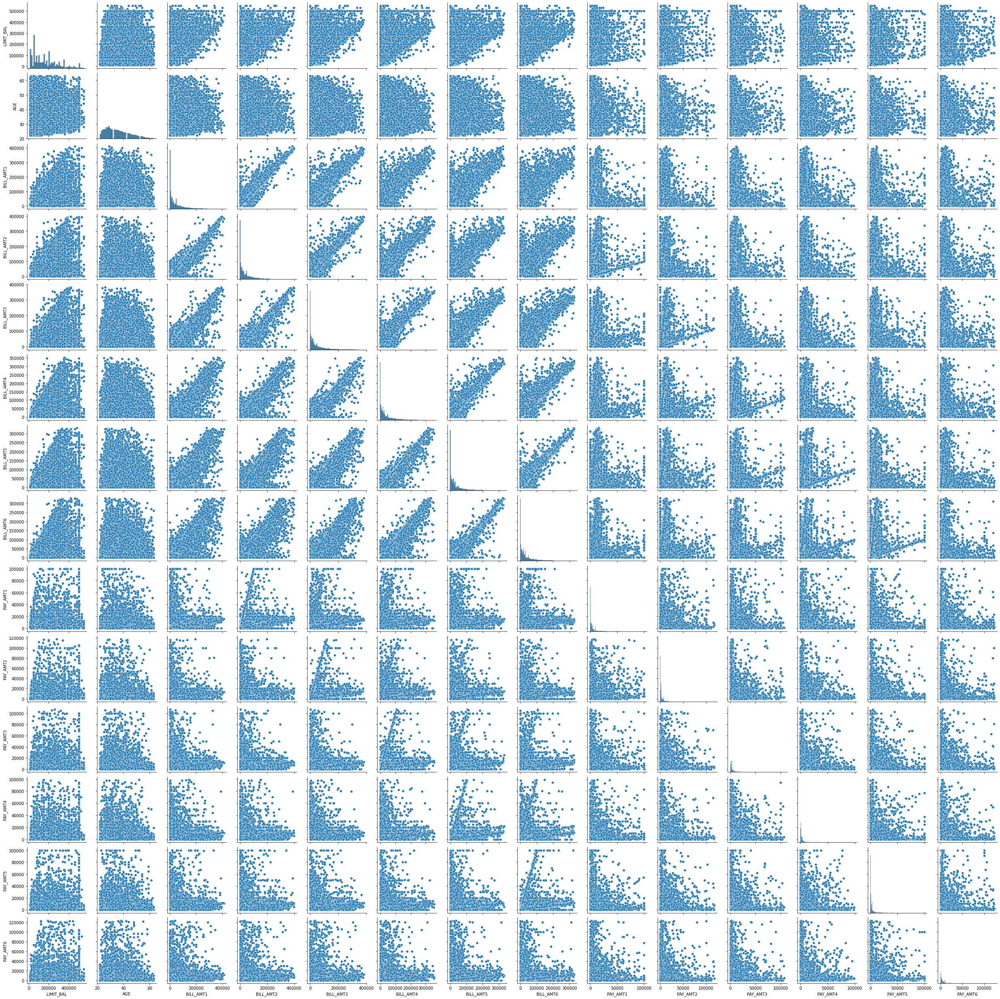

In [15]:
sns.pairplot(data[['LIMIT_BAL', 'AGE'] + [f'BILL_AMT{i}' for i in range(1, 7)] + [f'PAY_AMT{i}' for i in range(1, 7)]])

# Визуализация и описательная статистика

Для начала выведем сводную информацию о признаках.
Выводится количество записей, средние значения, стандартное отклонение, минимальное и максимальное значения, медиана и значения квантилей.

In [16]:
data.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
count,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,...,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000,22594.000000
mean,159822.682128,1.604807,1.852616,1.555634,35.248119,-0.013499,-0.121227,-0.152828,-0.204656,-0.252766,...,39190.529477,36382.006860,34972.142693,4505.125697,4477.238338,4044.493494,3733.613747,3665.622732,3955.393467,0.225104
std,122016.547996,0.488903,0.782935,0.520826,8.952223,1.122570,1.197582,1.204259,1.180397,1.143752,...,53846.160574,50851.798467,49884.775816,8461.153448,8971.647730,8533.492145,8079.263936,7973.556075,9880.385042,0.417660
min,10000.000000,1.000000,0.000000,0.000000,22.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-1000.000000,-1073.000000,-1410.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2301.000000,1726.250000,1225.250000,974.000000,789.000000,390.000000,268.250000,209.250000,66.250000,0.000000
50%,130000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,18712.000000,17774.500000,16378.500000,2055.000000,2000.000000,1720.000000,1467.500000,1500.000000,1400.000000,0.000000
75%,230000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,50942.500000,48482.750000,47333.000000,5000.000000,5000.000000,4133.500000,3967.500000,3925.250000,3836.250000,0.000000
max,550000.000000,2.000000,6.000000,3.000000,63.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,353426.000000,331653.000000,327929.000000,100082.000000,117698.000000,107139.000000,98828.000000,100207.000000,123347.000000,1.000000


Выведем диаграммы рассеивания для всех признаков и целевого значения - "default".

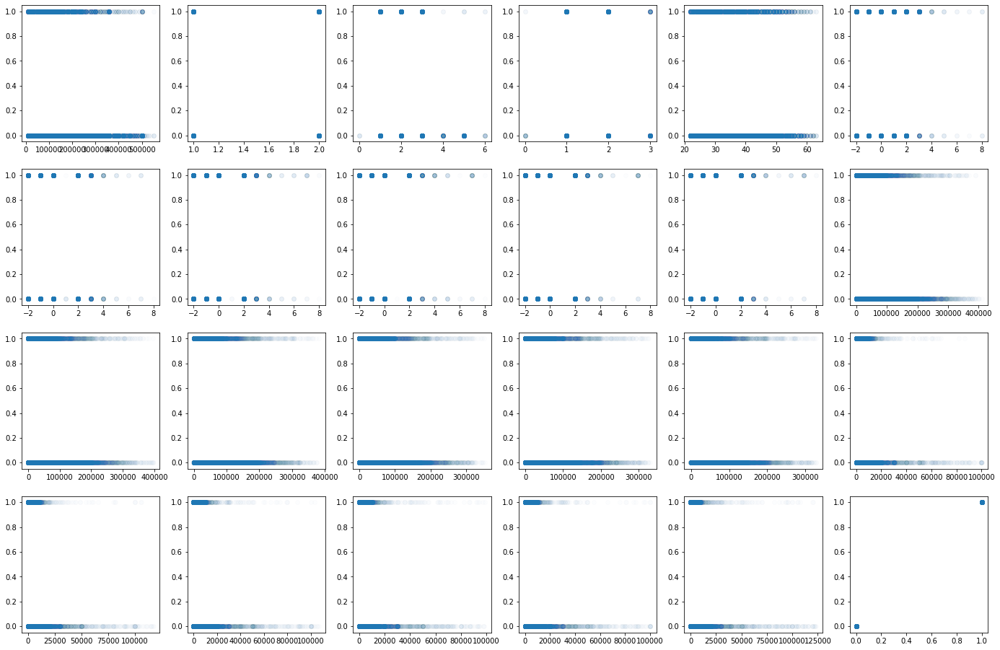

In [17]:
i = 1
plt.rcParams["figure.figsize"] = (24, 16)
for column in data.columns :
  plt.subplot(4, 6, i)
  plt.scatter(data[column], data['default'], alpha = 0.01)
  i += 1

In [18]:
np.random.seed(42)
random_subset = np.random.choice(np.arange(data.shape[0]), size=100, replace=False)

Теперь построим диаграммы рассеивания для всех возможных переменных, где цвет точки определяется значением столбца "default".
Так как точек очень много, построим только 100 из них, которые выберем случайным образом.

No handles with labels found to put in legend.


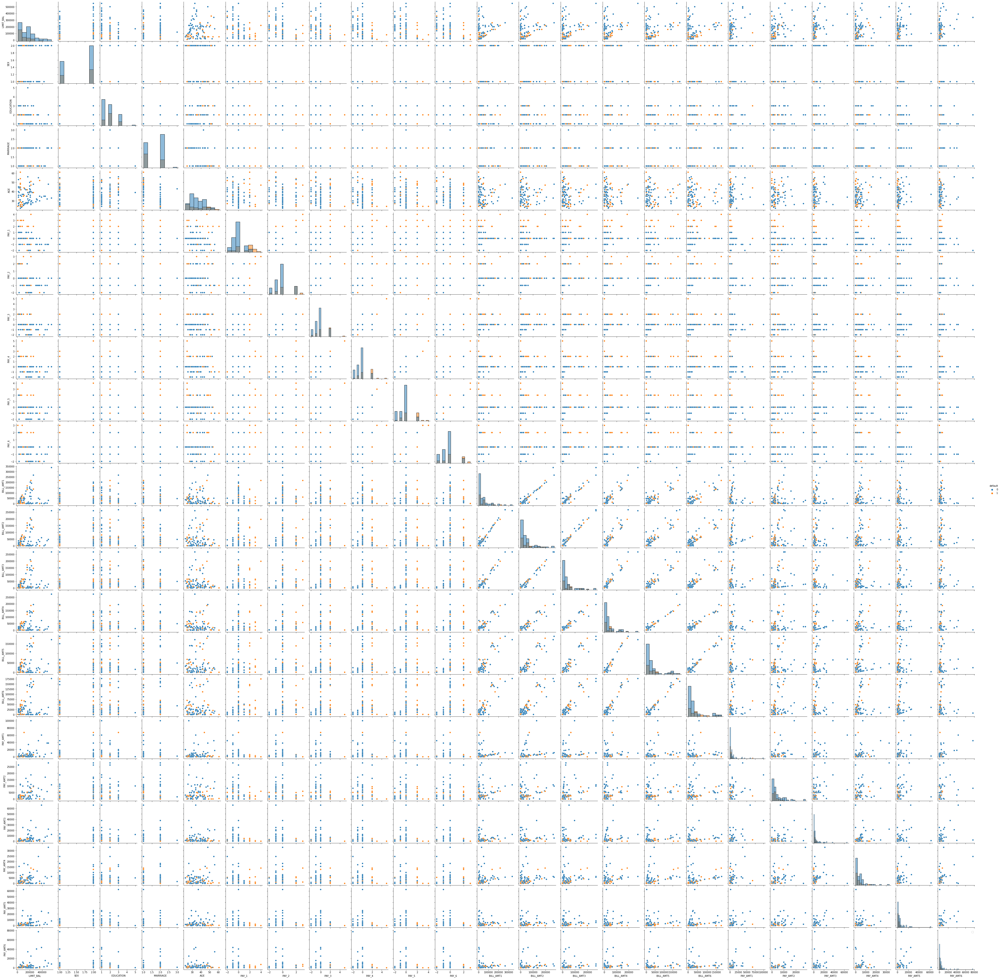

In [19]:
sns.pairplot(data.iloc[random_subset], hue='default', diag_kind='hist')
plt.legend()

На главной диагонали предыдущего графика находились гистограммы.
Построим их отдельно для всех признаков.

/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

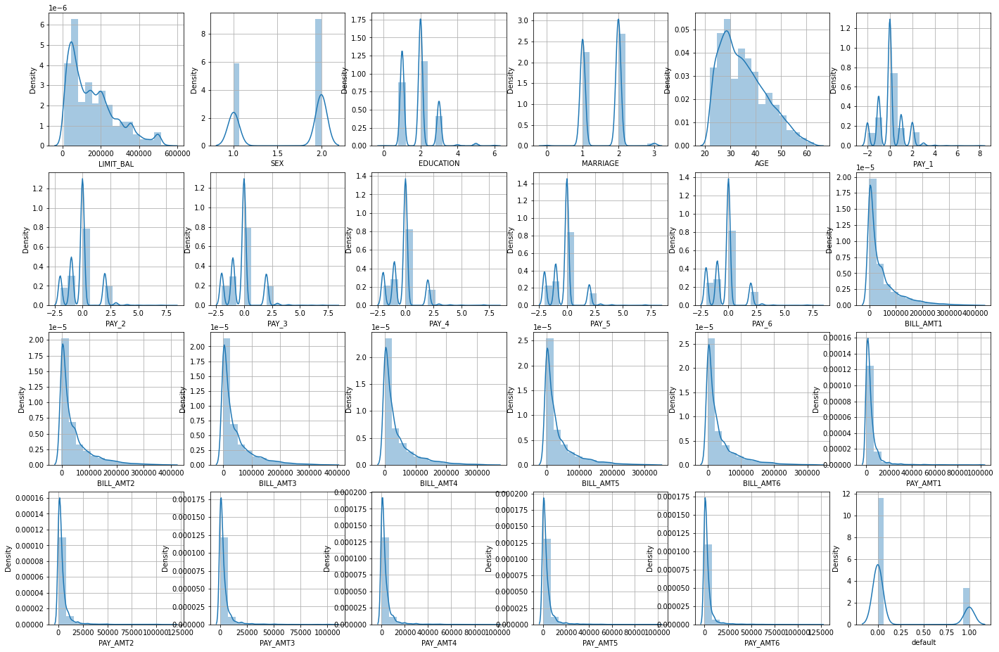

In [20]:
i = 1
plt.rcParams["figure.figsize"] = (24, 16)
for column in data.columns :
  plt.subplot(4, 6, i)
  sns.distplot(data[column], bins=15)
  plt.grid()
  i += 1

In [ ]:
Также важным способом визуализации данных является ящик с усами. Построим его для всех признаков.

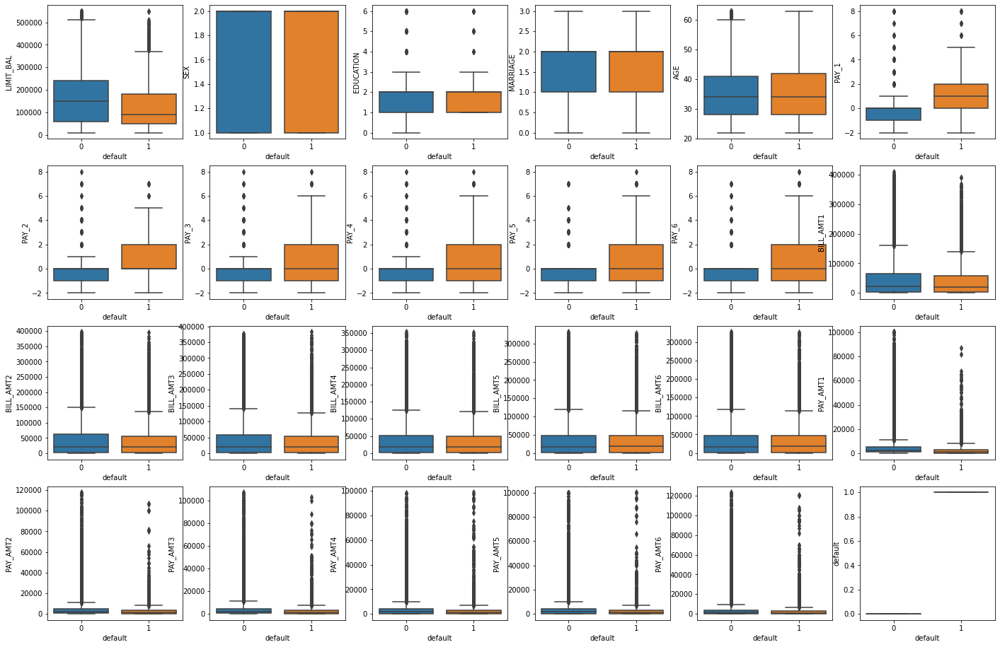

In [21]:
i = 1
plt.rcParams["figure.figsize"] = (24, 16)
for column in data.columns :
  plt.subplot(4, 6, i)
  sns.boxplot(x="default", y=column, data=data)
  i += 1

In [ ]:
Также информацию можно получить из скрипичных графиков.

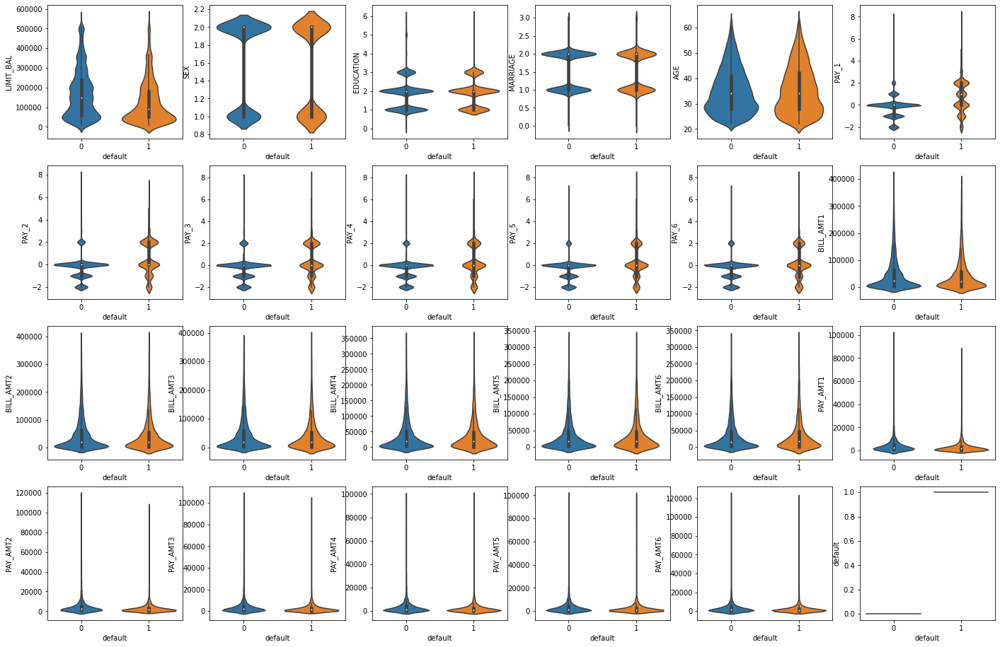

In [22]:
i = 1
plt.rcParams["figure.figsize"] = (24, 16)
for column in data.columns :
  plt.subplot(4, 6, i)
  sns.violinplot(x="default", y=column, data=data)
  i += 1

Вычислим матрицу корреляции для наших признаков.

In [23]:
corr_mat = data.corr()
corr_mat

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
LIMIT_BAL,1.000000,0.036433,-0.222452,-0.101316,0.129756,-0.281930,-0.311027,-0.300398,-0.282211,-0.266004,...,0.211217,0.212804,0.203840,0.235760,0.230492,0.229694,0.224777,0.228021,0.218751,-0.152905
SEX,0.036433,1.000000,0.006823,-0.029853,-0.098606,-0.057625,-0.073739,-0.071463,-0.061923,-0.055483,...,-0.007385,-0.002983,-0.000803,0.002811,0.004139,0.006581,0.010796,0.013115,0.012083,-0.046614
EDUCATION,-0.222452,0.006823,1.000000,-0.150848,0.181632,0.104903,0.121853,0.112670,0.108310,0.097683,...,0.014757,0.005891,0.006469,-0.053220,-0.048674,-0.052984,-0.051537,-0.057182,-0.038980,0.027017
MARRIAGE,-0.101316,-0.029853,-0.150848,1.000000,-0.420215,0.018659,0.023480,0.035962,0.034432,0.037837,...,-0.013349,-0.015265,-0.014267,-0.008308,-0.010895,-0.009706,-0.013979,-0.003527,-0.003492,-0.024611
AGE,0.129756,-0.098606,0.181632,-0.420215,1.000000,-0.041627,-0.048259,-0.049625,-0.046425,-0.056585,...,0.026940,0.025744,0.024705,0.025679,0.024664,0.021289,0.021846,0.018520,0.015526,0.012928
PAY_1,-0.281930,-0.057625,0.104903,0.018659,-0.041627,1.000000,0.673486,0.575273,0.546291,0.516508,...,0.210339,0.211086,0.210441,-0.116052,-0.105404,-0.089908,-0.081775,-0.073682,-0.062258,0.325283
PAY_2,-0.311027,-0.073739,0.121853,0.023480,-0.048259,0.673486,1.000000,0.768098,0.665742,0.628979,...,0.257606,0.256420,0.254626,-0.096115,-0.077863,-0.060762,-0.052296,-0.042374,-0.036306,0.260478
PAY_3,-0.300398,-0.071463,0.112670,0.035962,-0.049625,0.575273,0.768098,1.000000,0.781925,0.693987,...,0.260187,0.259464,0.257373,0.007038,-0.091698,-0.061683,-0.050100,-0.039892,-0.038240,0.235777
PAY_4,-0.282211,-0.061923,0.108310,0.034432,-0.046425,0.546291,0.665742,0.781925,1.000000,0.822729,...,0.280103,0.279336,0.279168,-0.004765,0.011386,-0.077707,-0.043802,-0.023171,-0.032449,0.221744
PAY_5,-0.266004,-0.055483,0.097683,0.037837,-0.056585,0.516508,0.628979,0.693987,0.822729,1.000000,...,0.303573,0.305124,0.301822,-0.005942,0.002281,0.025868,-0.060821,-0.023102,-0.022245,0.210381


Удобно визуализировать матрицу корреляции.

<AxesSubplot:>

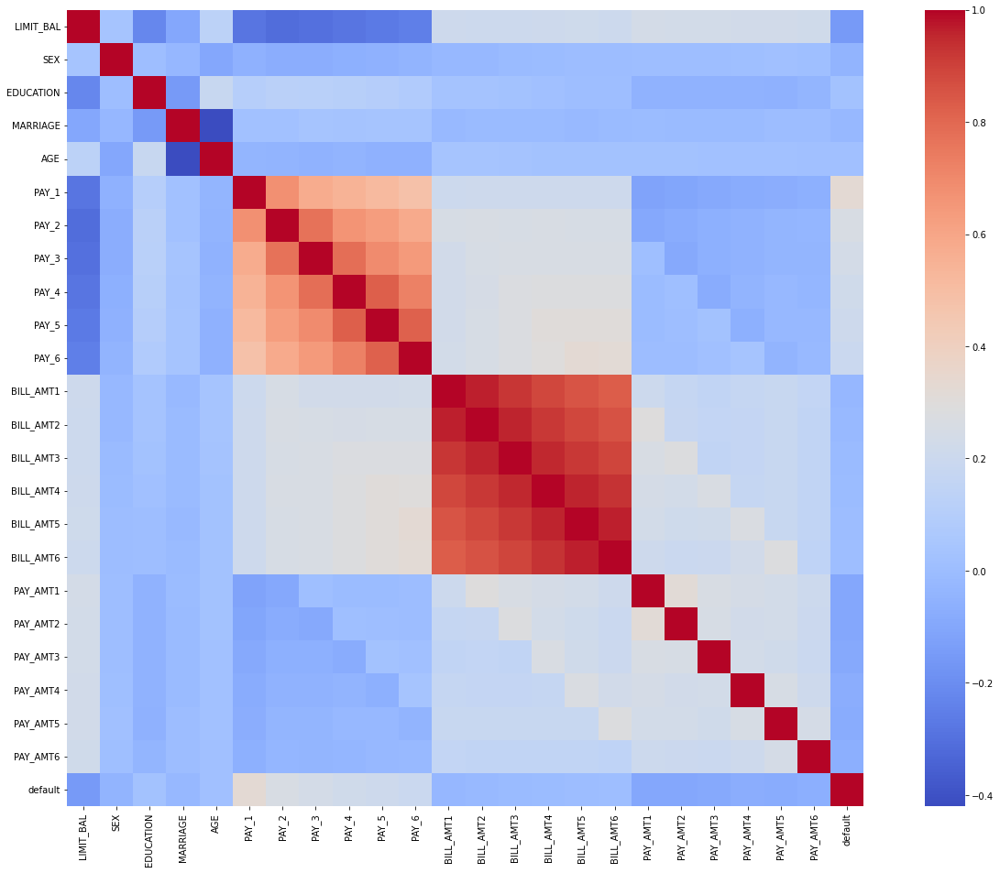

In [24]:
sns.heatmap(corr_mat, square=True, cmap='coolwarm')

Сравним каждое значение таблицы со значением 0.5 и выведем, какие из них больше.

In [25]:
abs(corr_mat) > 0.5

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
LIMIT_BAL,True,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
SEX,False,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
EDUCATION,False,False,True,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
MARRIAGE,False,False,False,True,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
AGE,False,False,False,False,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
PAY_1,False,False,False,False,False,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
PAY_2,False,False,False,False,False,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
PAY_3,False,False,False,False,False,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
PAY_4,False,False,False,False,False,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
PAY_5,False,False,False,False,False,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False


In [ ]:
Ниже представлен список пар признаков, коэффициент корреляции которых больше 0.5.

In [26]:
corr_mat.where(np.triu(abs(corr_mat) > 0.5, k=1)).stack().sort_values(ascending=False)

BILL_AMT5  BILL_AMT6    0.966685
BILL_AMT1  BILL_AMT2    0.962995
BILL_AMT4  BILL_AMT5    0.958954
BILL_AMT2  BILL_AMT3    0.957801
BILL_AMT3  BILL_AMT4    0.953338
BILL_AMT4  BILL_AMT6    0.931019
BILL_AMT1  BILL_AMT3    0.926109
BILL_AMT2  BILL_AMT4    0.918561
BILL_AMT3  BILL_AMT5    0.918393
           BILL_AMT6    0.892275
BILL_AMT1  BILL_AMT4    0.888040
BILL_AMT2  BILL_AMT5    0.886202
           BILL_AMT6    0.861187
BILL_AMT1  BILL_AMT5    0.855624
           BILL_AMT6    0.831416
PAY_4      PAY_5        0.822729
PAY_5      PAY_6        0.818571
PAY_3      PAY_4        0.781925
PAY_2      PAY_3        0.768098
PAY_4      PAY_6        0.723101
PAY_3      PAY_5        0.693987
PAY_1      PAY_2        0.673486
PAY_2      PAY_4        0.665742
PAY_3      PAY_6        0.642123
PAY_2      PAY_5        0.628979
           PAY_6        0.582626
PAY_1      PAY_3        0.575273
           PAY_4        0.546291
           PAY_5        0.516508
dtype: float64

# Нормализация признаков

In [ ]:
Выполним стандартизацию признаков. В результате значения приводятся к нулевому среднему и единичному отклонению.

In [27]:
data_stand = (data - data.mean(axis = 0))/data.std(axis = 0)
data_stand.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_1,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default
count,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,...,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04,2.259400e+04
mean,-3.522209e-17,6.918624e-17,-1.358566e-16,1.031504e-16,-6.038072e-17,-2.515863e-18,-7.547590e-18,1.509518e-17,2.264277e-17,7.547590e-18,...,6.038072e-17,2.138484e-17,-6.163865e-17,5.786486e-17,4.654347e-17,1.509518e-17,-2.012691e-17,1.132139e-17,8.176556e-18,-5.786486e-17
std,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,...,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00
min,-1.227888e+00,-1.237069e+00,-2.366245e+00,-2.986861e+00,-1.479869e+00,-1.769601e+00,-1.568805e+00,-1.533865e+00,-1.520966e+00,-1.527633e+00,...,-7.463955e-01,-7.365523e-01,-7.293236e-01,-5.324482e-01,-4.990430e-01,-4.739553e-01,-4.621230e-01,-4.597224e-01,-4.003279e-01,-5.389647e-01
25%,-9.000638e-01,-1.237069e+00,-1.089000e+00,-1.066833e+00,-8.096446e-01,-8.787876e-01,-7.337893e-01,-7.034796e-01,-6.737935e-01,-6.533180e-01,...,-6.850912e-01,-6.815050e-01,-6.764968e-01,-4.173338e-01,-4.110993e-01,-4.282530e-01,-4.289207e-01,-4.334795e-01,-3.936227e-01,-5.389647e-01
50%,-2.444151e-01,8.083268e-01,1.882459e-01,8.531945e-01,-1.394200e-01,1.202522e-02,1.012263e-01,1.269064e-01,1.733790e-01,2.209974e-01,...,-3.803155e-01,-3.659164e-01,-3.727318e-01,-2.895735e-01,-2.761185e-01,-2.723965e-01,-2.804852e-01,-2.716006e-01,-2.586330e-01,-5.389647e-01
75%,5.751459e-01,8.083268e-01,1.882459e-01,8.531945e-01,6.425087e-01,1.202522e-02,1.012263e-01,1.269064e-01,1.733790e-01,2.209974e-01,...,2.182509e-01,2.379610e-01,2.477882e-01,5.848781e-02,5.826819e-02,1.043026e-02,2.894896e-02,3.256104e-02,-1.205859e-02,-5.389647e-01
max,3.197741e+00,8.083268e-01,5.297229e+00,2.773222e+00,3.099999e+00,7.138528e+00,6.781351e+00,6.769994e+00,6.950759e+00,7.215521e+00,...,5.835801e+00,5.806500e+00,5.872671e+00,1.129596e+01,1.261984e+01,1.208116e+01,1.177018e+01,1.210769e+01,1.208370e+01,1.855327e+00


# Метод ближайших соседей

Для начала разобьем данные на матрицу признаков и столбец значений.

In [28]:
X = data_stand.drop(['default'], axis=1)
y = data['default']

Затем разобьем данные на обучающую и тестовую выборки. Размер тестовой выборки равен 0.25 от общего количества.

In [29]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 42)

N_train, _ = X_train.shape 
N_test,  _ = X_test.shape 

N_train, N_test

(16945, 5649)

Создадим модель KNN с числом соседей равным 3, обучим и посмотрим на результаты.

In [30]:
from sklearn.neighbors import KNeighborsClassifier as KNN

model = KNN(3)
model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [31]:
y_train_predict = model.predict(X_train)
y_test_predict  = model.predict(X_test)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


Вычислим ошибку полученных значений в разных метриках.

In [32]:

from sklearn.metrics import mean_squared_error, r2_score

MSE_train = mean_squared_error(y_train, y_train_predict)
MSE_test  = mean_squared_error(y_test,  y_test_predict)
R2_train = r2_score(y_train, y_train_predict)
R2_test  = r2_score(y_test,  y_test_predict)

MSE_train, MSE_test, R2_train, R2_test

(0.13526113897904987,
 0.22924411400247832,
 0.22651884187716886,
 -0.3243331949040147)

Вычислим коэффициент детерминации R^2.

In [33]:
model.score(X_train, y_train)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


0.8647388610209501

In [34]:
model.score(X_test, y_test)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


0.7707558859975217

Повторим действия для алгоритма KNN с числом соседей равным 7 и сравним результаты.

In [48]:
model = KNN(7)
model.fit(X_train, y_train)
y_train_predict = model.predict(X_train)
y_test_predict  = model.predict(X_test)
MSE_train = mean_squared_error(y_train, y_train_predict)
MSE_test  = mean_squared_error(y_test,  y_test_predict)
R2_train = r2_score(y_train, y_train_predict)
R2_test  = r2_score(y_test,  y_test_predict)

MSE_train, MSE_test, R2_train, R2_test, model.score(X_train, y_train), model.score(X_test, y_test)

/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:441: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


(0.1699616406019475,
 0.20304478668790937,
 0.028086502882306408,
 -0.17298082977212736,
 0.8300383593980525,
 0.7969552133120906)

# Выводы

В результате выполненного задания мы избавились от выбросов в данных, нормировали данные и провели визуализацию данных.
Обучили метод KNN с числом соседей 3 и 7. Оба метода выдали неплохую точность на тестовой и обучающей выборке. В случае 3 соседей точность на обучающей выборке получилась больше, а в случае 7 - на тестовой. Но разница незначительна.